<a href="https://colab.research.google.com/github/kentaterasaki/Coral-Reef-Topic-Modeling/blob/main/Topic_Modeling_Pipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install segment-anything

# Download SAM checkpoint
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

import os
import shutil

from google.colab import drive
drive.mount('/content/drive')

import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import numpy as np
from collections import defaultdict
import matplotlib.pyplot as plt
import cv2
import warnings
from PIL import Image
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator





--2024-11-21 06:53:57--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.35.238.71, 13.35.238.103, 13.35.238.113, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.35.238.71|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   120MB/s    in 24s     

2024-11-21 06:54:21 (101 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]

Mounted at /content/drive



Directory structure:
Base path: /content/drive/MyDrive/0521_coral_images
Input path: /content/drive/MyDrive/0521_coral_images/filtered_images
Output path: /content/drive/MyDrive/0521_coral_images/SAM_output
Checkpoint path: /content/drive/MyDrive/0521_coral_images/sam_vit_h_4b8939.pth

Found 10 images to process:
  - Copy of png_array_3528_1716299733811194379_271913409439.png
  - Copy of png_array_3530_1716299735251099254_272028400179.png
  - Copy of png_array_3529_1716299734531130678_271970904809.png
  - Copy of png_array_3524_1716299730931302715_271683427959.png
  - Copy of png_array_3526_1716299732370993461_271798418699.png
  ... and 5 more

Initializing models...


/usr/local/lib/python3.10/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)
Downloading: "https://dow


Processing images...

Processing image 1/10: Copy of png_array_3528_1716299733811194379_271913409439.png
Successfully processed Copy of png_array_3528_1716299733811194379_271913409439.png - Generated 10 masks

Processing image 2/10: Copy of png_array_3530_1716299735251099254_272028400179.png
Successfully processed Copy of png_array_3530_1716299735251099254_272028400179.png - Generated 9 masks

Processing image 3/10: Copy of png_array_3529_1716299734531130678_271970904809.png
Successfully processed Copy of png_array_3529_1716299734531130678_271970904809.png - Generated 11 masks

Processing image 4/10: Copy of png_array_3524_1716299730931302715_271683427959.png
Successfully processed Copy of png_array_3524_1716299730931302715_271683427959.png - Generated 8 masks

Processing image 5/10: Copy of png_array_3526_1716299732370993461_271798418699.png
Successfully processed Copy of png_array_3526_1716299732370993461_271798418699.png - Generated 15 masks

Processing image 6/10: Copy of png_arra

<ipython-input-2-9a770e70771c>:515: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(topics, rotation=45, ha='right')


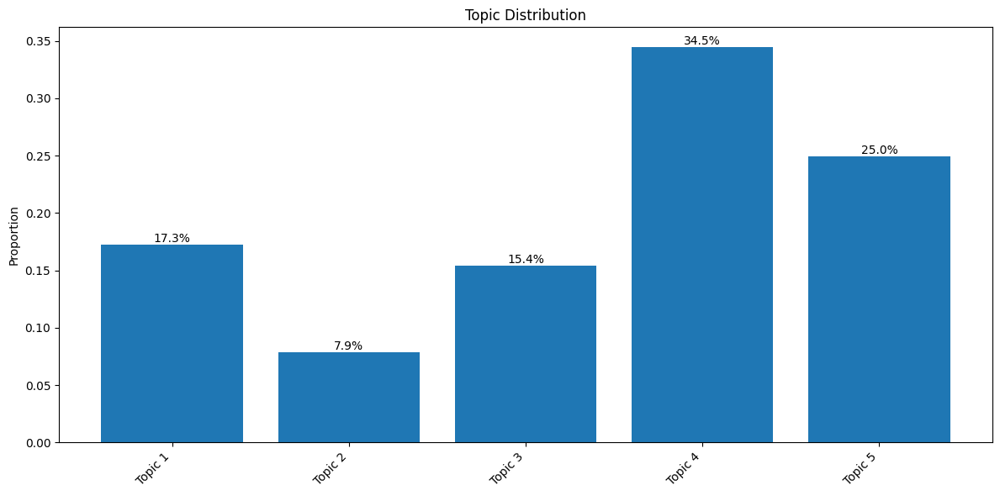


Analyzing Copy of png_array_3528_1716299733811194379_271913409439.png:


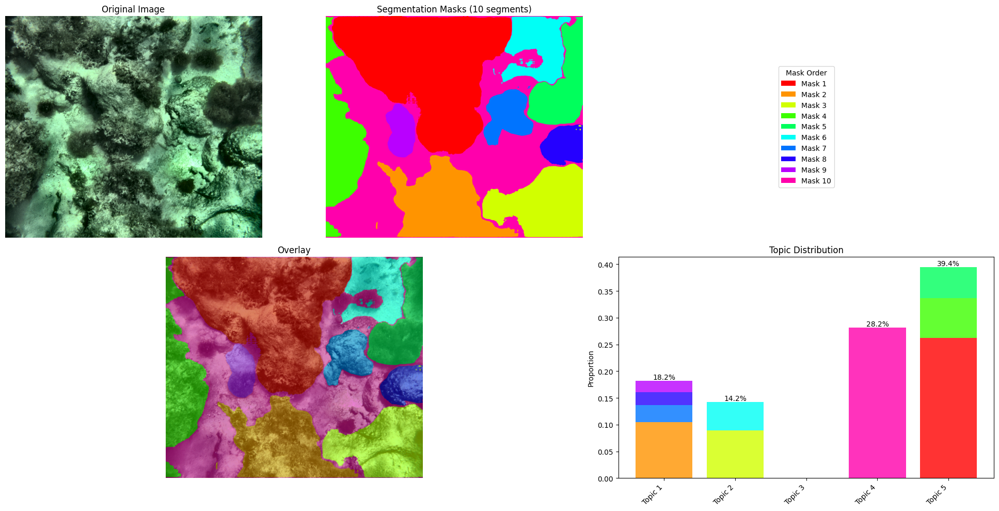


Analyzing Copy of png_array_3530_1716299735251099254_272028400179.png:


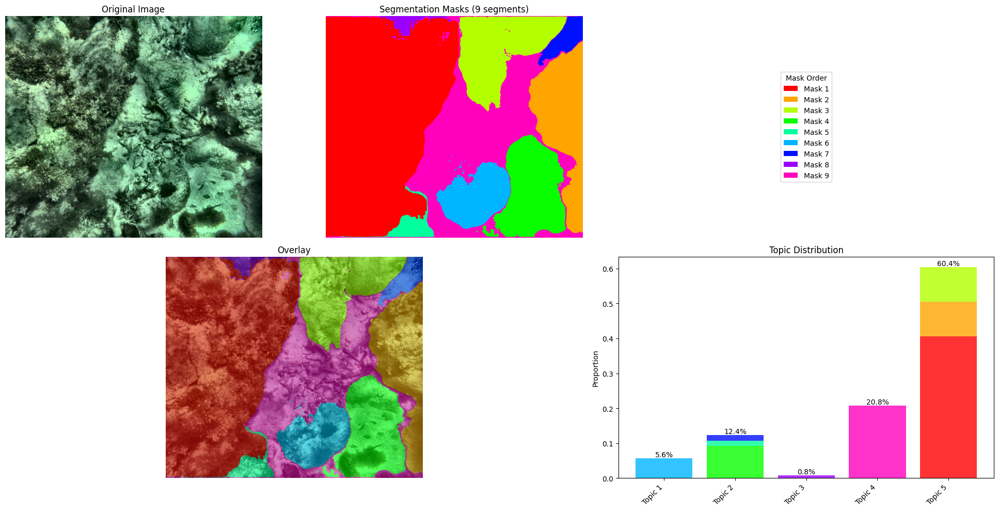


Analyzing Copy of png_array_3529_1716299734531130678_271970904809.png:


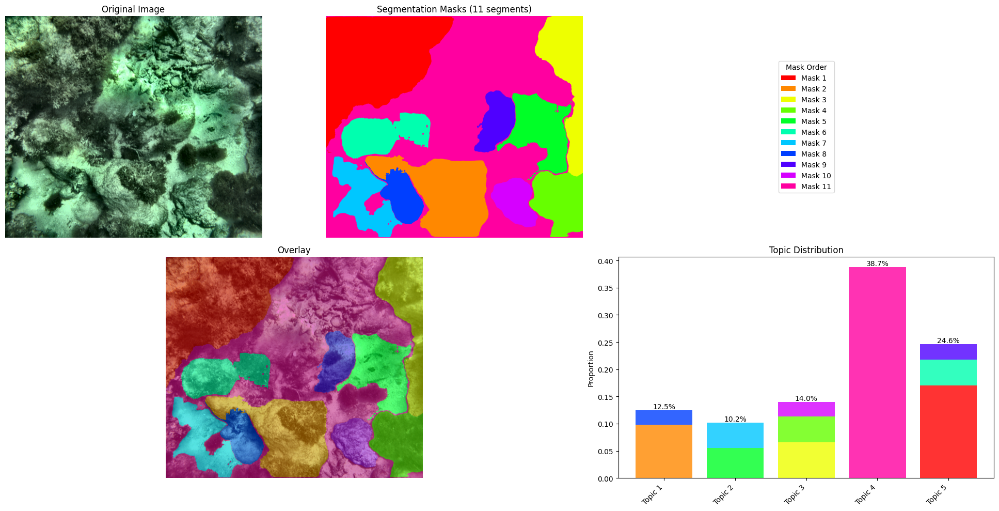


Analyzing Copy of png_array_3524_1716299730931302715_271683427959.png:


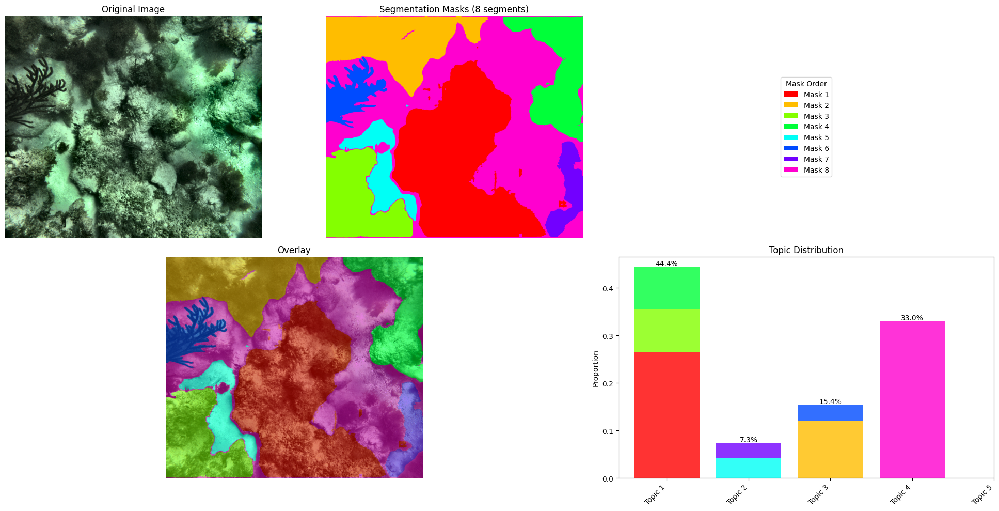


Analyzing Copy of png_array_3526_1716299732370993461_271798418699.png:


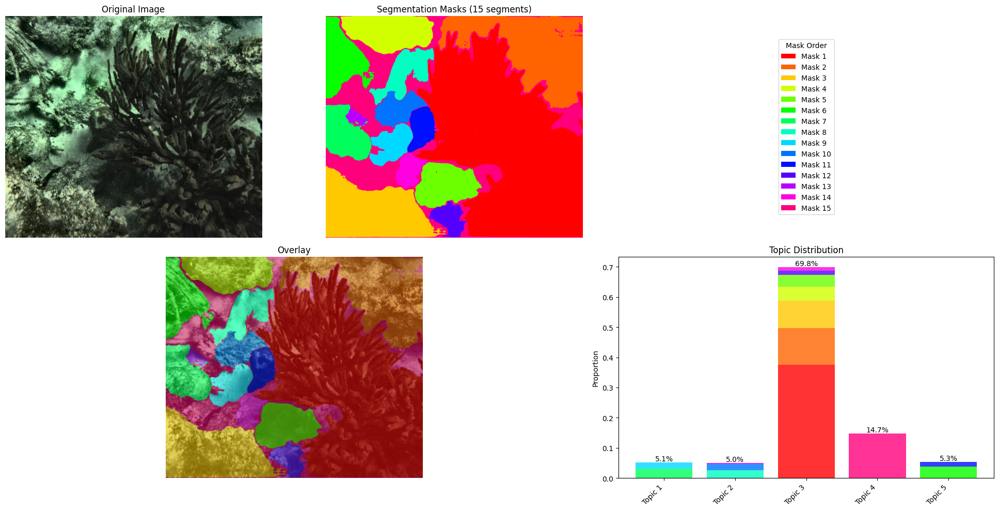


Analyzing Copy of png_array_3527_1716299733091328732_271855914069.png:


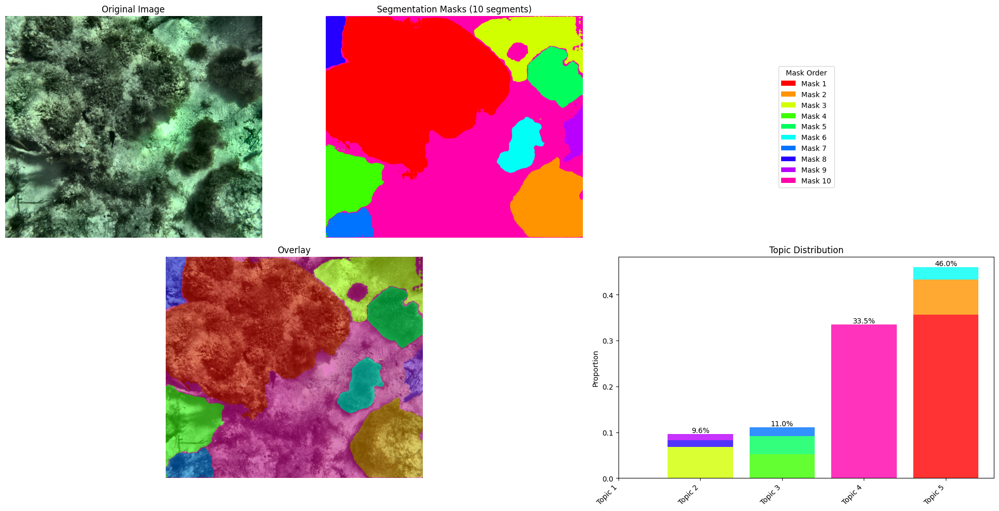


Analyzing Copy of png_array_3523_1716299730211179127_271625932589.png:


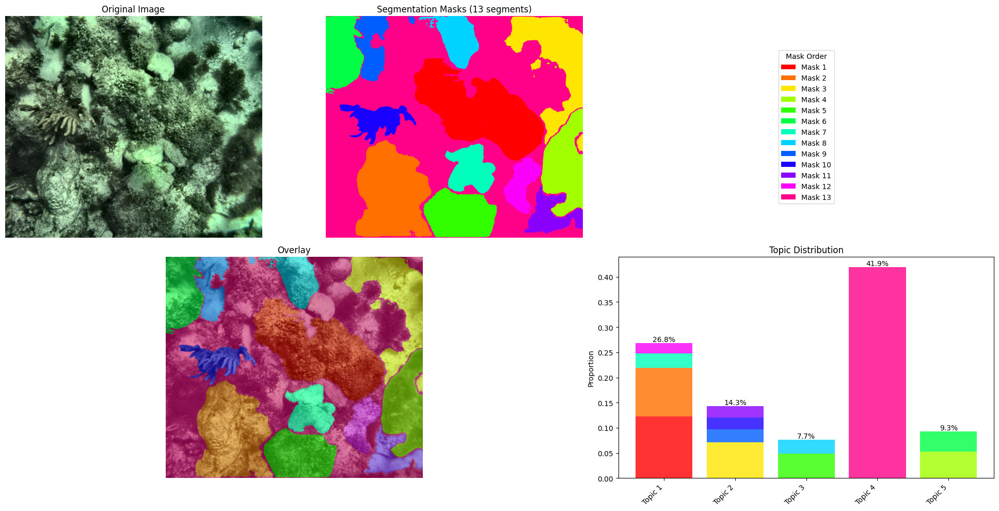


Analyzing Copy of png_array_3522_1716299729491715966_271568437219.png:


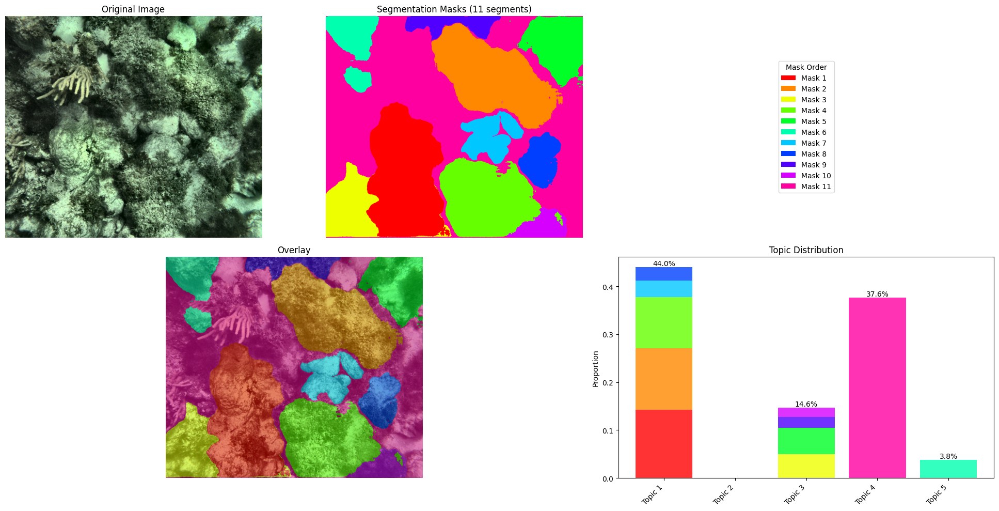


Analyzing Copy of png_array_3525_1716299731651496073_271740923329.png:


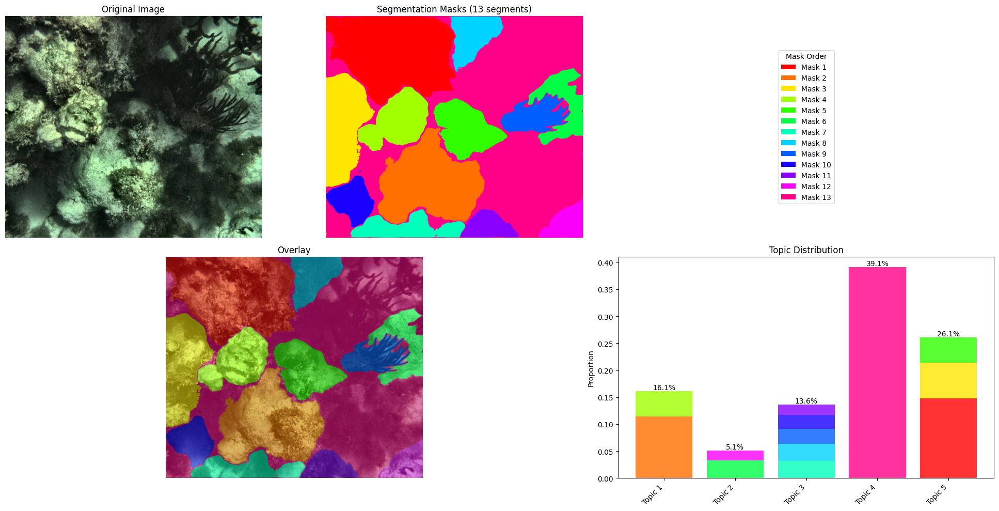


Analyzing Copy of png_array_3511_1716299721572868014_270935988149.png:


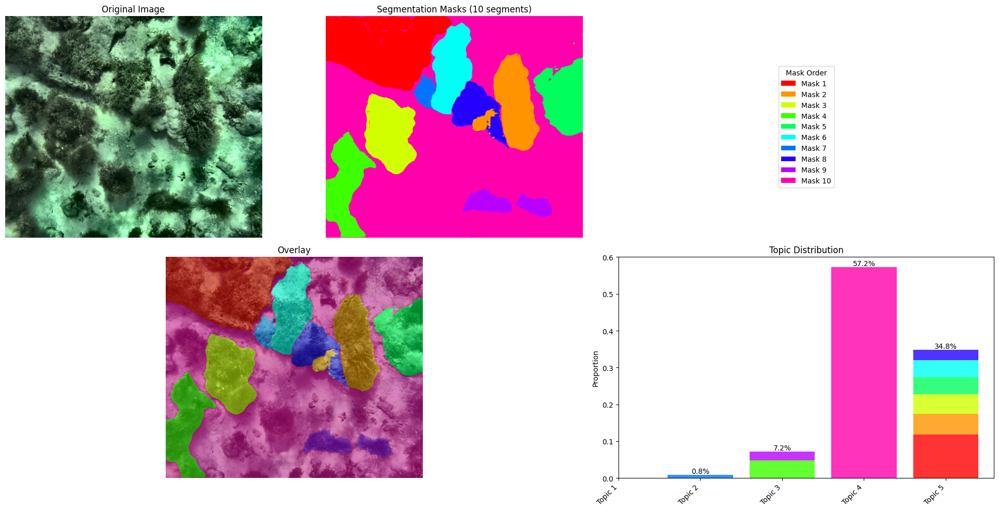


Analysis complete!


In [2]:
class CoralReefSegmenter:
    def __init__(self, input_path, output_path, checkpoint_path, max_masks=20, max_initial_size_ratio=0.6):
        self.input_path = input_path
        self.output_path = output_path
        self.checkpoint_path = checkpoint_path
        self.max_masks = max_masks
        self.max_initial_size_ratio = max_initial_size_ratio  # Maximum size for initial masks
        self.mask_generator = self._initialize_sam()

    def _initialize_sam(self):
        """Initialize SAM with adjusted parameters"""
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        sam = sam_model_registry["vit_h"](checkpoint=self.checkpoint_path)
        sam.to(device=device)

        return SamAutomaticMaskGenerator(
            sam,
            points_per_side=32,
            pred_iou_thresh=0.8,
            stability_score_thresh=0.85,
            crop_n_layers=1,
            crop_n_points_downscale_factor=2,
            min_mask_region_area=50
        )

    def remove_overlapping_masks(self, masks, image_shape):
        """Remove overlapping portions of masks with size limit on initial masks"""
        if not masks:
            return []

        # Calculate maximum allowed size for initial masks
        total_pixels = image_shape[0] * image_shape[1]
        max_initial_size = total_pixels * self.max_initial_size_ratio

        # Sort masks by area in descending order
        masks = sorted(masks, key=lambda x: x['area'], reverse=True)

        # Filter out initial large masks
        filtered_masks = []
        for idx, mask in enumerate(masks):
            if idx < 2:  # For the first two masks
                if mask['area'] > max_initial_size:
                    continue
            filtered_masks.append(mask)

        # Process remaining masks to remove overlaps
        used_pixels = np.zeros(filtered_masks[0]['segmentation'].shape, dtype=bool)
        final_masks = []

        for mask in filtered_masks[:self.max_masks]:
            new_mask = mask['segmentation'] & ~used_pixels
            new_area = np.sum(new_mask)

            if new_area > mask['area'] * 0.2:  # Keep if at least 20% of original size remains
                mask['segmentation'] = new_mask
                mask['area'] = new_area
                final_masks.append(mask)
                used_pixels = used_pixels | new_mask

        return final_masks

    def process_image(self, image_path):
        """Process image and generate segmentation masks"""
        if not os.path.exists(image_path):
            raise FileNotFoundError(f"Image file not found: {image_path}")

        image = cv2.imread(image_path)
        if image is None:
            raise ValueError(f"Failed to read image: {image_path}")

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Generate initial masks
        masks = self.mask_generator.generate(image)

        if not masks:
            print(f"Warning: No masks generated for {image_path}")
            return image, []

        # Remove overlapping portions and apply size limits
        masks = self.remove_overlapping_masks(masks, image.shape)

        # Add background mask for uncovered areas
        if masks:
            all_segments = np.zeros(masks[0]['segmentation'].shape, dtype=bool)
            for mask in masks:
                all_segments = all_segments | mask['segmentation']

            if not np.all(all_segments):
                background_mask = ~all_segments
                background_area = np.sum(background_mask)

                if background_area > 0:
                    background_dict = {
                        'segmentation': background_mask,
                        'area': background_area,
                        'predicted_iou': 1.0,
                        'stability_score': 1.0
                    }
                    masks.append(background_dict)

        return image, masks

class CoralReefTopicModeler:
    def __init__(self, min_topics=4, max_topics=8, feature_extractor='resnet18'):
        self.min_topics = min_topics
        self.max_topics = max_topics
        self.n_topics = None
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

        # Initialize feature extractor
        self.feature_extractor = self._initialize_feature_extractor(feature_extractor)

        # Updated transform pipeline
        self.transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize((224, 224)),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                              std=[0.229, 0.224, 0.225])
        ])

        # Initialize clustering model
        self.kmeans = None
        self.scaler = StandardScaler()

        # Store topic distributions
        self.image_topic_distributions = {}
        self.global_topic_distribution = None
        self.topic_descriptions = {}

    def _initialize_feature_extractor(self, model_name):
        """Initialize pre-trained CNN for feature extraction"""
        if model_name == 'resnet18':
            model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        elif model_name == 'resnet50':
            model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        else:
            raise ValueError(f"Unsupported model: {model_name}")

        # Remove the final classification layer
        model = nn.Sequential(*list(model.children())[:-1])
        model.to(self.device)
        model.eval()
        return model

    def extract_features(self, image, mask):
        """
        Extract features from a masked region of the image, including color and texture features
        """
        try:
            # Apply mask to image
            masked_image = image.copy()
            for c in range(3):
                masked_image[:,:,c] = masked_image[:,:,c] * mask

            # Extract color features
            color_features = self._extract_color_features(masked_image, mask)

            # Extract CNN features
            # Convert numpy array to tensor directly
            tensor_image = self.transform(masked_image).unsqueeze(0).to(self.device)

            # Extract features
            with torch.no_grad():
                cnn_features = self.feature_extractor(tensor_image)
                cnn_features = cnn_features.squeeze().cpu().numpy()

            # Combine features
            combined_features = np.concatenate([
                cnn_features.flatten(),
                color_features
            ])

            return combined_features

        except Exception as e:
            print(f"Error in feature extraction: {str(e)}")
            # Return a zero vector of the expected size
            return np.zeros(512 + 15)  # CNN features + color features

    def _extract_color_features(self, masked_image, mask):
        """
        Extract color-based features from the masked region
        """
        # Convert to different color spaces
        hsv_image = cv2.cvtColor(masked_image, cv2.COLOR_RGB2HSV)
        lab_image = cv2.cvtColor(masked_image, cv2.COLOR_RGB2LAB)

        features = []

        # For each color space (RGB, HSV, LAB)
        for color_img in [masked_image, hsv_image, lab_image]:
            for channel in range(3):
                # Get masked channel values
                channel_values = color_img[:,:,channel][mask]
                if len(channel_values) > 0:
                    # Calculate statistics
                    features.extend([
                        np.mean(channel_values),
                        np.std(channel_values),
                        np.percentile(channel_values, 25),
                        np.percentile(channel_values, 75),
                        np.max(channel_values) - np.min(channel_values)
                    ])
                else:
                    features.extend([0, 0, 0, 0, 0])

        return np.array(features)

    def _calculate_texture_features(self, masked_image, mask):
        """
        Calculate texture features using local binary patterns or other texture metrics
        """
        # Convert to grayscale for texture analysis
        gray = cv2.cvtColor(masked_image, cv2.COLOR_RGB2GRAY)
        masked_gray = gray * mask

        if np.sum(mask) == 0:
            return np.zeros(10)

        # Calculate some basic texture features
        texture_features = []

        # Local gradients
        sobelx = cv2.Sobel(masked_gray, cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(masked_gray, cv2.CV_64F, 0, 1, ksize=3)
        gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

        # Add gradient statistics
        texture_features.extend([
            np.mean(gradient_magnitude[mask]),
            np.std(gradient_magnitude[mask]),
            np.percentile(gradient_magnitude[mask], 75)
        ])

        return np.array(texture_features)

    def _find_optimal_topics(self, features):
        """Find optimal number of topics using silhouette analysis"""
        best_score = -1
        best_n_topics = self.min_topics

        print("Finding optimal number of topics...")
        for n_topics in range(self.min_topics, self.max_topics + 1):
            kmeans = KMeans(n_clusters=n_topics, random_state=42)
            cluster_labels = kmeans.fit_predict(features)

            silhouette_avg = silhouette_score(features, cluster_labels)
            print(f"Silhouette score for {n_topics} topics: {silhouette_avg:.3f}")

            if silhouette_avg > best_score:
                best_score = silhouette_avg
                best_n_topics = n_topics

        print(f"\nSelected {best_n_topics} topics based on silhouette analysis")
        return best_n_topics

    def fit(self, image_masks_dict):
        """Fit the topic model using enhanced features and clustering"""
        all_features = []

        # Extract features from all masks in all images
        print("Extracting enhanced features from masks...")
        total_masks = sum(len(masks) for _, (_, masks) in image_masks_dict.items())
        processed = 0

        for image_path, (image, masks) in image_masks_dict.items():
            for mask in masks:
                features = self.extract_features(image, mask['segmentation'])
                all_features.append(features)
                processed += 1
                if processed % 5 == 0:
                    print(f"Processed {processed}/{total_masks} masks")

        # Scale features
        X = self.scaler.fit_transform(np.array(all_features))

        # Find optimal number of topics
        self.n_topics = self._find_optimal_topics(X)

        try:
            # Try MiniBatchKMeans first
            print(f"Fitting MiniBatchKMeans with {self.n_topics} topics...")
            self.kmeans = MiniBatchKMeans(
                n_clusters=self.n_topics,
                batch_size=min(100, len(X)),  # Adjust batch size based on data size
                random_state=42,
                n_init='auto'
            )
        except Exception as e:
            # Fallback to regular KMeans if MiniBatchKMeans fails
            print(f"Falling back to regular KMeans due to: {str(e)}")
            self.kmeans = KMeans(
                n_clusters=self.n_topics,
                random_state=42,
                n_init='auto'
            )

        self.kmeans.fit(X)

        # Calculate cluster quality metrics
        labels = self.kmeans.labels_
        silhouette_avg = silhouette_score(X, labels)
        print(f"\nFinal clustering quality (silhouette score): {silhouette_avg:.3f}")

        # Analyze cluster characteristics
        print("\nAnalyzing cluster characteristics:")
        for i in range(self.n_topics):
            cluster_samples = X[labels == i]
            if len(cluster_samples) > 0:
                avg_distance = np.mean(np.linalg.norm(cluster_samples - self.kmeans.cluster_centers_[i], axis=1))
                print(f"Topic {i+1}: {len(cluster_samples)} samples, "
                      f"avg distance to center: {avg_distance:.3f}")

    def set_topic_descriptions(self, descriptions=None):
        """
        Set topic descriptions. If no descriptions are provided, use generic names.

        Args:
            descriptions: Optional list of descriptions. If None, uses generic "Topic X" format
        """
        if descriptions is None:
            # Use generic topic names
            self.topic_descriptions = {i: f"Topic {i+1}" for i in range(self.n_topics)}
        else:
            # Validate and use provided descriptions
            if len(descriptions) != self.n_topics:
                raise ValueError(f"Expected {self.n_topics} descriptions, got {len(descriptions)}")
            self.topic_descriptions = {i: desc for i, desc in enumerate(descriptions)}

    def analyze_image(self, image_path, image, masks):
        """Analyze a single image and return its topic distribution"""
        if not masks:
            return np.zeros(self.n_topics)

        # Extract and cluster features for each mask
        mask_topics = []
        mask_areas = []

        for mask in masks:
            features = self.extract_features(image, mask['segmentation'])
            scaled_features = self.scaler.transform(features.reshape(1, -1))
            topic = self.kmeans.predict(scaled_features)[0]
            mask_topics.append(topic)
            mask_areas.append(mask['area'])

        # Calculate topic distribution weighted by mask areas
        total_area = sum(mask_areas)
        topic_distribution = np.zeros(self.n_topics)

        for topic, area in zip(mask_topics, mask_areas):
            topic_distribution[topic] += area / total_area

        self.image_topic_distributions[image_path] = topic_distribution
        return topic_distribution

    def analyze_all_images(self, image_masks_dict):
        """Analyze all images and compute global topic distribution"""
        all_distributions = []

        for image_path, (image, masks) in image_masks_dict.items():
            distribution = self.analyze_image(image_path, image, masks)
            all_distributions.append(distribution)

        self.global_topic_distribution = np.mean(all_distributions, axis=0)
        return self.global_topic_distribution

    def visualize_topics(self, image_path=None, segmenter=None):
        """
        Visualize topic distribution with multi-colored bars showing all contributing masks
        """
        import matplotlib.pyplot as plt
        import matplotlib.gridspec as gridspec
        import matplotlib.patches as patches

        if image_path:
            if image_path not in self.image_topic_distributions:
                raise ValueError(f"No analysis found for image: {image_path}")
            distribution = self.image_topic_distributions[image_path]
            title = f"Analysis for {os.path.basename(image_path)}"

            # Create figure with grid layout
            fig = plt.figure(figsize=(20, 10))
            gs = gridspec.GridSpec(2, 3, figure=fig, width_ratios=[1, 1, 1.2])

            if segmenter is not None:
                try:
                    # Get the image and masks
                    image, masks = segmenter.process_image(image_path)

                    # Plot original image
                    ax_orig = fig.add_subplot(gs[0, 0])
                    ax_orig.imshow(image)
                    ax_orig.set_title('Original Image')
                    ax_orig.axis('off')

                    # Generate colors and create mask
                    colors = self._generate_distinct_colors(len(masks))
                    composite_mask = np.zeros((*image.shape[:2], 3), dtype=np.uint8)

                    # Create and plot segmentation mask
                    for idx, mask_data in enumerate(masks):
                        mask = mask_data['segmentation']
                        color = colors[idx]
                        for c in range(3):
                            composite_mask[:, :, c][mask] = color[c]

                    # Plot segmentation masks
                    ax_mask = fig.add_subplot(gs[0, 1])
                    ax_mask.imshow(composite_mask)
                    ax_mask.set_title(f'Segmentation Masks ({len(masks)} segments)')
                    ax_mask.axis('off')

                    # Plot overlay
                    ax_overlay = fig.add_subplot(gs[1, :2])
                    ax_overlay.imshow(image)
                    ax_overlay.imshow(composite_mask, alpha=0.5)
                    ax_overlay.set_title('Overlay')
                    ax_overlay.axis('off')

                    # Create mask order legend
                    ax_legend = fig.add_subplot(gs[0, 2])
                    ax_legend.axis('off')
                    legend_elements = []

                    for idx, color in enumerate(colors):
                        color_rgb = np.array(color) / 255.0
                        legend_elements.append(patches.Patch(facecolor=color_rgb,
                                                          label=f'Mask {idx+1}'))

                    ax_legend.legend(handles=legend_elements,
                                  title='Mask Order',
                                  loc='center',
                                  bbox_to_anchor=(0.5, 0.5))

                    # Calculate mask contributions to each topic
                    mask_topics = []
                    mask_areas = []

                    for mask in masks:
                        features = self.extract_features(image, mask['segmentation'])
                        scaled_features = self.scaler.transform(features.reshape(1, -1))
                        topic = self.kmeans.predict(scaled_features)[0]
                        mask_topics.append(topic)
                        mask_areas.append(mask['area'])

                    # Create topic contribution dictionary
                    topic_contributions = {i: [] for i in range(self.n_topics)}
                    total_area = sum(mask_areas)

                    for topic, area, color in zip(mask_topics, mask_areas, colors):
                        topic_contributions[topic].append({
                            'area': area / total_area,
                            'color': np.array(color) / 255.0
                        })

                    # Plot topic distribution with multi-colored bars
                    ax_dist = fig.add_subplot(gs[1, 2])
                    topics = [self.topic_descriptions.get(i, f"Topic {i+1}")
                            for i in range(self.n_topics)]

                    bar_positions = np.arange(len(topics))
                    bottom = np.zeros(len(topics))

                    # Plot stacked bars for each topic
                    for topic_idx in range(len(topics)):
                        if topic_idx in topic_contributions:
                            contributions = topic_contributions[topic_idx]
                            for contrib in contributions:
                                height = contrib['area']
                                if height > 0:  # Only plot if there's a contribution
                                    ax_dist.bar(topic_idx, height, bottom=bottom[topic_idx],
                                              color=contrib['color'], alpha=0.8,
                                              width=0.8)
                                    bottom[topic_idx] += height

                    ax_dist.set_title("Topic Distribution")
                    ax_dist.set_xticks(bar_positions)
                    ax_dist.set_xticklabels(topics, rotation=45, ha='right')
                    ax_dist.set_ylabel('Proportion')

                    # Add percentage labels on top of bars
                    for idx, total in enumerate(distribution):
                        if total > 0:
                            ax_dist.text(idx, total, f'{total*100:.1f}%',
                                      ha='center', va='bottom')

                except Exception as e:
                    print(f"Warning: Could not generate visualization: {str(e)}")
                    import traceback
                    traceback.print_exc()

            else:
                # Plot only topic distribution if no segmenter is provided
                ax_dist = fig.add_subplot(gs[:, :])
                self._plot_simple_distribution(ax_dist, distribution, topics)

        else:
            # For global distribution, use simpler layout
            if self.global_topic_distribution is None:
                raise ValueError("No global analysis available")

            plt.figure(figsize=(12, 6))
            topics = [self.topic_descriptions.get(i, f"Topic {i+1}")
                    for i in range(self.n_topics)]
            self._plot_simple_distribution(plt.gca(), self.global_topic_distribution, topics)

        plt.tight_layout()
        plt.show()

    def _plot_simple_distribution(self, ax, distribution, topics):
        """Helper method for plotting simple distribution without mask colors"""
        bars = ax.bar(topics, distribution)
        ax.set_title("Topic Distribution")
        ax.set_xticklabels(topics, rotation=45, ha='right')
        ax.set_ylabel('Proportion')

        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                    f'{height*100:.1f}%',
                    ha='center', va='bottom')

    def _generate_distinct_colors(self, n):
        """Generate n visually distinct colors"""
        colors = []
        for i in range(n):
            hue = i / n
            saturation = 0.7 + np.random.random() * 0.3
            value = 0.7 + np.random.random() * 0.3
            rgb = tuple(round(x * 255) for x in plt.cm.hsv(hue)[:3])
            colors.append(rgb)
        return colors

# Example usage integrated with your existing code:
# Main execution
if __name__ == "__main__":
    # Wait a moment to ensure drive is mounted
    import time
    time.sleep(2)

    # Set up paths for Google Drive
    BASE_PATH = '/content/drive/MyDrive/0521_coral_images'
    INPUT_PATH = os.path.join(BASE_PATH, 'filtered_images')
    OUTPUT_PATH = os.path.join(BASE_PATH, 'SAM_output')
    CHECKPOINT_PATH = os.path.join(BASE_PATH, 'sam_vit_h_4b8939.pth')
    MAX_MASKS = 20
    MAX_INITIAL_SIZE_RATIO = 0.6

    # Verify BASE_PATH exists
    if not os.path.exists(BASE_PATH):
        print(f"Creating base directory: {BASE_PATH}")
        os.makedirs(BASE_PATH, exist_ok=True)

    # Create other directories if they don't exist
    for path in [INPUT_PATH, OUTPUT_PATH]:
        if not os.path.exists(path):
            print(f"Creating directory: {path}")
            os.makedirs(path, exist_ok=True)

    # Print directory structure for verification
    print("\nDirectory structure:")
    print(f"Base path: {BASE_PATH}")
    print(f"Input path: {INPUT_PATH}")
    print(f"Output path: {OUTPUT_PATH}")
    print(f"Checkpoint path: {CHECKPOINT_PATH}")

    # Check for SAM checkpoint
    if not os.path.exists(CHECKPOINT_PATH):
        print(f"\nDownloading SAM checkpoint to: {CHECKPOINT_PATH}")
        !wget -P {BASE_PATH} https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
        print("Checkpoint downloaded!")

    # Get list of image files
    image_files = [f for f in os.listdir(INPUT_PATH)
                   if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    if not image_files:
        raise FileNotFoundError(
            f"No image files found in {INPUT_PATH}\n"
            "Please add some images to the 'filtered_images' directory in your Google Drive\n"
            f"Path should be: {INPUT_PATH}"
        )

    print(f"\nFound {len(image_files)} images to process:")
    for f in image_files[:5]:  # Show first 5 images
        print(f"  - {f}")
    if len(image_files) > 5:
        print(f"  ... and {len(image_files)-5} more")

    # Initialize models
    print("\nInitializing models...")
    segmenter = CoralReefSegmenter(
        input_path=INPUT_PATH,
        output_path=OUTPUT_PATH,
        checkpoint_path=CHECKPOINT_PATH,
        max_masks=MAX_MASKS,
        max_initial_size_ratio=MAX_INITIAL_SIZE_RATIO
    )

    # Initialize topic modeler with min/max topics instead of n_topics
    topic_modeler = CoralReefTopicModeler(min_topics=4, max_topics=8)

    # Process images
    image_masks_dict = {}
    print("\nProcessing images...")

    for i, filename in enumerate(image_files, 1):
        print(f"\nProcessing image {i}/{len(image_files)}: {filename}")
        image_path = os.path.join(INPUT_PATH, filename)

        try:
            image, masks = segmenter.process_image(image_path)
            if masks:
                image_masks_dict[image_path] = (image, masks)
                print(f"Successfully processed {filename} - Generated {len(masks)} masks")
            else:
                print(f"No masks generated for {filename}")
        except Exception as e:
            print(f"Error processing {filename}: {str(e)}")
            continue

    # Process with topic modeling
    if image_masks_dict:
        print("\nFitting topic model...")
        topic_modeler.fit(image_masks_dict)

        # Set generic topic descriptions (no arguments needed)
        topic_modeler.set_topic_descriptions()

        # Analyze all images
        print("\nAnalyzing images...")
        global_distribution = topic_modeler.analyze_all_images(image_masks_dict)

        # Visualize results
        print("\nGlobal Topic Distribution:")
        topic_modeler.visualize_topics()

        # Analyze individual images
        for image_path in image_masks_dict:
            print(f"\nAnalyzing {os.path.basename(image_path)}:")
            topic_modeler.visualize_topics(image_path, segmenter)

        print("\nAnalysis complete!")